[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://drive.google.com/file/d/1OdkUurQXMkIL6-ESefv0vnqfT-tOjvzM/view?usp=sharing)

# Satelite image dataset

https://www.kaggle.com/datasets/umeradnaan/remote-sensing-satellite-images/data

https://captain-whu.github.io/AID/

## Read dataset

In [ ]:
import os
import time
import shutil
import random
import pathlib
import itertools
import warnings

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('darkgrid')

from PIL import Image
import cv2

from imblearn.over_sampling import RandomOverSampler
from sklearn.model_selection import train_test_split

os.environ["KERAS_BACKEND"] = "jax"

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models, regularizers
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import (
    Conv2D, MaxPooling2D, Flatten, Dense, Activation, Dropout,
    BatchNormalization, GlobalAveragePooling2D, Input, Reshape
)
from tensorflow.keras.optimizers import Adam, Adamax
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.applications import ConvNeXtSmall

import keras_hub
import kagglehub

import timeit

In [1]:
path = kagglehub.dataset_download("umeradnaan/remote-sensing-satellite-images")

print("Path to dataset files:", path)

100%|██████████| 49.9M/49.9M [00:00<00:00, 178MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/umeradnaan/remote-sensing-satellite-images/versions/1


In [2]:
!ls /root/.cache/kagglehub/datasets/umeradnaan/remote-sensing-satellite-images/versions/1/"Remote Sensing Data.v2i.yolov8"

data.yaml  README.dataset.txt  README.roboflow.txt  test  train  valid


In [3]:
!ls /root/.cache/kagglehub/datasets/umeradnaan/remote-sensing-satellite-images/versions/1/"Remote Sensing Data.v2i.yolov8"/train

images	labels


In [4]:
image_dir = '/root/.cache/kagglehub/datasets/umeradnaan/remote-sensing-satellite-images/versions/1/Remote Sensing Data.v2i.yolov8/train/images'
label_dir = '/root/.cache/kagglehub/datasets/umeradnaan/remote-sensing-satellite-images/versions/1/Remote Sensing Data.v2i.yolov8/train/labels'

In [5]:
image_files = sorted([f for f in os.listdir(image_dir) if f.endswith('.jpg') or f.endswith('.png')])
label_files = sorted([f for f in os.listdir(label_dir) if f.endswith('.txt')])

In [6]:
image_paths = []
class_labels = []
center_x = []
center_y = []
width = []
height = []

for img, lbl in zip(image_files, label_files):

    img_path = os.path.join(image_dir, img)
    label_path = os.path.join(label_dir, lbl)

    with open(label_path, 'r') as file:
        for line in file:

            parts = line.strip().split()
            if len(parts) == 5:

                image_paths.append(img_path)
                class_labels.append(int(parts[0]))
                center_x.append(float(parts[1]))
                center_y.append(float(parts[2]))
                width.append(float(parts[3]))
                height.append(float(parts[4]))

df = pd.DataFrame({
    'image_path': image_paths,
    'class_label': class_labels,
    'center_x': center_x,
    'center_y': center_y,
    'width': width,
    'height': height
})

In [7]:
df.head().style

,image_path,class_label,center_x,center_y,width,height
0,/root/.cache/kagglehub/datasets/umeradnaan/remote-sensing-satellite-images/versions/1/Remote Sensing Data.v2i.yolov8/train/images/001_jpg.rf.3c48b90e2a70a137d6c43366186973c9.jpg,2,0.498437,0.498437,0.996094,0.996094
1,/root/.cache/kagglehub/datasets/umeradnaan/remote-sensing-satellite-images/versions/1/Remote Sensing Data.v2i.yolov8/train/images/002_jpg.rf.2d0adfe65bc5ae1558cd99ebd454a58d.jpg,10,0.510938,0.618750,0.970313,0.754687
2,/root/.cache/kagglehub/datasets/umeradnaan/remote-sensing-satellite-images/versions/1/Remote Sensing Data.v2i.yolov8/train/images/002_jpg.rf.c0f3396d4dadaf545cd3bd51fbf644e8.jpg,9,0.498437,0.498437,0.996094,0.996094
3,/root/.cache/kagglehub/datasets/umeradnaan/remote-sensing-satellite-images/versions/1/Remote Sensing Data.v2i.yolov8/train/images/002_jpg.rf.c5af433d8a4dee912516cda8b216bcba.jpg,4,0.498437,0.498437,0.996094,0.996094
4,/root/.cache/kagglehub/datasets/umeradnaan/remote-sensing-satellite-images/versions/1/Remote Sensing Data.v2i.yolov8/train/images/002_jpg.rf.d510acbca08e0c7d2063101ac992362c.jpg,5,0.498437,0.498437,0.996094,0.996094


In [8]:
df.shape

(748, 6)

## SAM (segment anything)

Check the documentation to get more info and aplications of SAM using keras

https://keras.io/keras_hub/guides/segment_anything_in_keras_hub/


In [78]:
# check image with more objects
df["image_path"].value_counts()

,count
image_path,
/root/.cache/kagglehub/datasets/umeradnaan/remote-sensing-satellite-images/versions/1/Remote Sensing Data.v2i.yolov8/train/images/004_jpg.rf.3d4088be97f761ef34881054e8321d9b.jpg,3
/root/.cache/kagglehub/datasets/umeradnaan/remote-sensing-satellite-images/versions/1/Remote Sensing Data.v2i.yolov8/train/images/069_jpg.rf.288cdfeadfa74143a17d850e3faeec37.jpg,3
/root/.cache/kagglehub/datasets/umeradnaan/remote-sensing-satellite-images/versions/1/Remote Sensing Data.v2i.yolov8/train/images/183_jpg.rf.33ef2ab063189d32c71e2643ca4b31d9.jpg,3
/root/.cache/kagglehub/datasets/umeradnaan/remote-sensing-satellite-images/versions/1/Remote Sensing Data.v2i.yolov8/train/images/255_jpg.rf.352aad09ddd03986771dff5018cc49fe.jpg,3
/root/.cache/kagglehub/datasets/umeradnaan/remote-sensing-satellite-images/versions/1/Remote Sensing Data.v2i.yolov8/train/images/295_jpg.rf.87654ca8a2ca7ef05d79ecf12b6fd7b3.jpg,3
...,...
/root/.cache/kagglehub/datasets/umeradnaan/remote-sensing-satellite-images/versions/1/Remote Sensing Data.v2i.yolov8/train/images/757_jpg.rf.f452d3113948367c89018c0620889e53.jpg,1
/root/.cache/kagglehub/datasets/umeradnaan/remote-sensing-satellite-images/versions/1/Remote Sensing Data.v2i.yolov8/train/images/011_jpg.rf.46e8b8c34cbc074305bb22db3ef1c0fe.jpg,1
/root/.cache/kagglehub/datasets/umeradnaan/remote-sensing-satellite-images/versions/1/Remote Sensing Data.v2i.yolov8/train/images/011_jpg.rf.ea0f4a3b6505849d566fefa493757489.jpg,1


In [79]:
df[df.image_path == "/root/.cache/kagglehub/datasets/umeradnaan/remote-sensing-satellite-images/versions/1/Remote Sensing Data.v2i.yolov8/train/images/004_jpg.rf.3d4088be97f761ef34881054e8321d9b.jpg"]

,image_path,class_label,center_x,center_y,width,height
7,/root/.cache/kagglehub/datasets/umeradnaan/rem...,4,0.304688,0.498437,0.609375,0.996094
8,/root/.cache/kagglehub/datasets/umeradnaan/rem...,4,0.821875,0.498437,0.347656,0.996094
9,/root/.cache/kagglehub/datasets/umeradnaan/rem...,13,0.654687,0.500781,0.240625,0.998437


In [80]:
!!pip install -Uq git+https://github.com/keras-team/keras-hub.git
!!pip install -Uq keras

[]

In [81]:
!!wget -q https://raw.githubusercontent.com/facebookresearch/segment-anything/main/notebooks/images/truck.jpg

[]

In [83]:
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30 / 255, 144 / 255, 255 / 255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)


def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels == 1]
    neg_points = coords[labels == 0]
    ax.scatter(
        pos_points[:, 0],
        pos_points[:, 1],
        color="green",
        marker="*",
        s=marker_size,
        edgecolor="white",
        linewidth=1.25,
    )
    ax.scatter(
        neg_points[:, 0],
        neg_points[:, 1],
        color="red",
        marker="*",
        s=marker_size,
        edgecolor="white",
        linewidth=1.25,
    )


def show_box(box, ax):
    box = box.reshape(-1)
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(
        plt.Rectangle((x0, y0), w, h, edgecolor="green", facecolor=(0, 0, 0, 0), lw=2)
    )


def inference_resizing(image, pad=True):
    # Compute Preprocess Shape
    image = ops.cast(image, dtype="float32")
    old_h, old_w = image.shape[0], image.shape[1]
    scale = 1024 * 1.0 / max(old_h, old_w)
    new_h = old_h * scale
    new_w = old_w * scale
    preprocess_shape = int(new_h + 0.5), int(new_w + 0.5)

    # Resize the image
    image = ops.image.resize(image[None, ...], preprocess_shape)[0]

    # Pad the shorter side
    if pad:
        pixel_mean = ops.array([123.675, 116.28, 103.53])
        pixel_std = ops.array([58.395, 57.12, 57.375])
        image = (image - pixel_mean) / pixel_std
        h, w = image.shape[0], image.shape[1]
        pad_h = 1024 - h
        pad_w = 1024 - w
        image = ops.pad(image, [(0, pad_h), (0, pad_w), (0, 0)])
        # KerasHub now rescales the images and normalizes them.
        # Just unnormalize such that when KerasHub normalizes them
        # again, the padded values map to 0.
        image = image * pixel_std + pixel_mean
    return image

In [84]:
# download model from hub
model = keras_hub.models.SAMImageSegmenter.from_preset("sam_huge_sa1b")

(640, 640, 3)


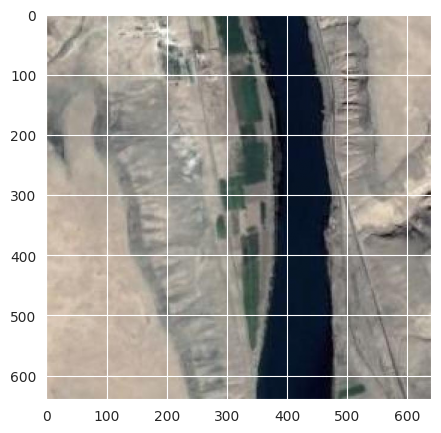

In [118]:
# load image
pwd_sample = "/root/.cache/kagglehub/datasets/umeradnaan/remote-sensing-satellite-images/versions/1/Remote Sensing Data.v2i.yolov8/train/images/004_jpg.rf.3d4088be97f761ef34881054e8321d9b.jpg"
input_label = np.array([1])
image = np.array(keras.utils.load_img(pwd_sample))
print(image.shape)
image = inference_resizing(image)

plt.figure(figsize=(5, 5))
plt.imshow(ops.convert_to_numpy(image) / 255.0)
plt.axis("on")
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 191s 191s/step


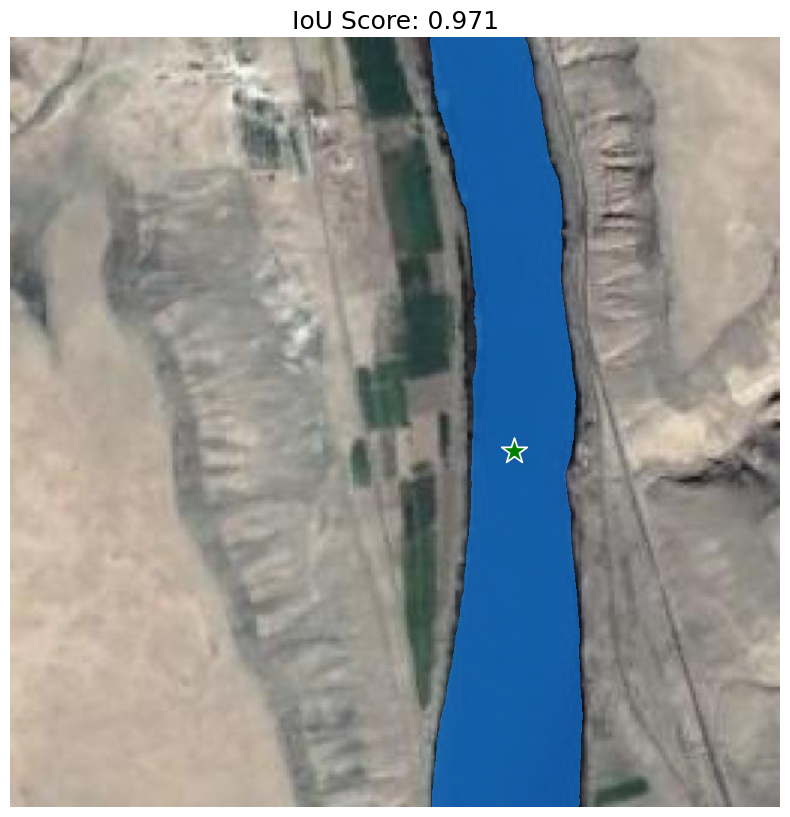

In [86]:
# predict using point
input_point = np.array([[670, 550]])

outputs = model.predict(
    {
        "images": image[np.newaxis, ...],
        "points": np.concatenate(
            [input_point[np.newaxis, ...], np.zeros((1, 1, 2))], axis=1
        ),
        "labels": np.concatenate(
            [input_label[np.newaxis, ...], np.full((1, 1), fill_value=-1)], axis=1
        ),
    }
)
# Resize the mask to our image shape i.e. (1024, 1024)
mask = inference_resizing(outputs["masks"][0][0][..., None], pad=False)[..., 0]
# Convert the logits to a numpy array
# and convert the logits to a boolean mask
mask = ops.convert_to_numpy(mask) > 0.0
iou_score = ops.convert_to_numpy(outputs["iou_pred"][0][0])

plt.figure(figsize=(10, 10))
plt.imshow(ops.convert_to_numpy(image) / 255.0)
show_mask(mask, plt.gca())
show_points(input_point, input_label, plt.gca())
plt.title(f"IoU Score: {iou_score:.3f}", fontsize=18)
plt.axis("off")
plt.show()

## Image classification

Get preprocessing part from:

https://www.kaggle.com/code/nirmalgaud/satellite-images-classification

In [9]:
df = df[['image_path', 'class_label']]

In [10]:
df

,image_path,class_label
0,/root/.cache/kagglehub/datasets/umeradnaan/rem...,2
1,/root/.cache/kagglehub/datasets/umeradnaan/rem...,10
2,/root/.cache/kagglehub/datasets/umeradnaan/rem...,9
3,/root/.cache/kagglehub/datasets/umeradnaan/rem...,4
4,/root/.cache/kagglehub/datasets/umeradnaan/rem...,5
...,...,...
743,/root/.cache/kagglehub/datasets/umeradnaan/rem...,7
744,/root/.cache/kagglehub/datasets/umeradnaan/rem...,3
745,/root/.cache/kagglehub/datasets/umeradnaan/rem...,2
746,/root/.cache/kagglehub/datasets/umeradnaan/rem...,3


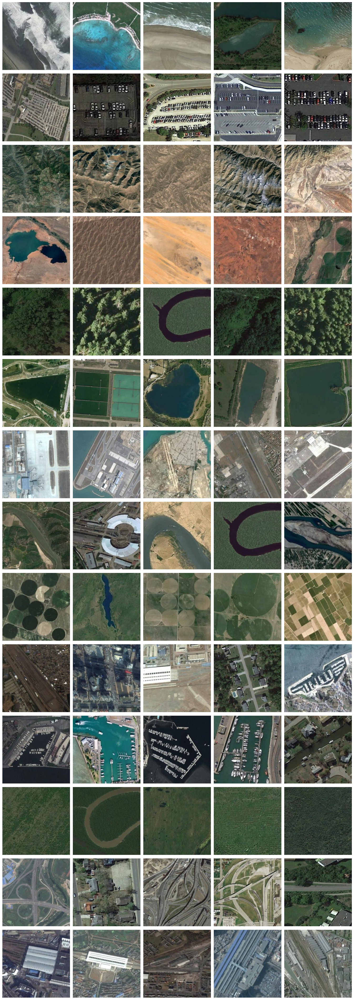

In [13]:
images_per_category = 5

class_labels = df['class_label'].unique()

fig, axes = plt.subplots(len(class_labels), images_per_category, figsize=(15, 3 * len(class_labels)))

for i, class_label in enumerate(class_labels):

    class_images = df[df['class_label'] == class_label]['image_path'].tolist()

    sampled_images = random.sample(class_images, min(images_per_category, len(class_images)))

    for j, image_path in enumerate(sampled_images):
        img = Image.open(image_path)

        axes[i, j].imshow(img)
        axes[i, j].axis('off')

        if j == 0:
            axes[i, j].set_ylabel(f"Class {class_label}", rotation=0, labelpad=50, fontsize=12, ha='right', va='center')

plt.tight_layout()
plt.show()

In [15]:
ros = RandomOverSampler(random_state=42)
X_resampled, y_resampled = ros.fit_resample(df[['image_path']], df['class_label'])

In [16]:
df_resampled = pd.DataFrame(X_resampled, columns=['image_path'])
df_resampled['class_label'] = y_resampled

In [17]:
print("\nClass distribution after oversampling:")
print(df_resampled['class_label'].value_counts())


Class distribution after oversampling:
class_label
2     125
10    125
9     125
4     125
5     125
8     125
1     125
13    125
0     125
3     125
11    125
6     125
7     125
12    125
Name: count, dtype: int64


In [18]:
df_resampled

,image_path,class_label
0,/root/.cache/kagglehub/datasets/umeradnaan/rem...,2
1,/root/.cache/kagglehub/datasets/umeradnaan/rem...,10
2,/root/.cache/kagglehub/datasets/umeradnaan/rem...,9
3,/root/.cache/kagglehub/datasets/umeradnaan/rem...,4
4,/root/.cache/kagglehub/datasets/umeradnaan/rem...,5
...,...,...
1745,/root/.cache/kagglehub/datasets/umeradnaan/rem...,13
1746,/root/.cache/kagglehub/datasets/umeradnaan/rem...,13
1747,/root/.cache/kagglehub/datasets/umeradnaan/rem...,13
1748,/root/.cache/kagglehub/datasets/umeradnaan/rem...,13


In [20]:
df_resampled['class_label'] = df_resampled['class_label'].astype(str)

In [21]:
train_df_new, temp_df_new = train_test_split(
    df_resampled,
    train_size=0.8,
    shuffle=True,
    random_state=42,
    stratify=df_resampled['class_label']
)

valid_df_new, test_df_new = train_test_split(
    temp_df_new,
    test_size=0.5,
    shuffle=True,
    random_state=42,
    stratify=temp_df_new['class_label']
)

In [22]:
batch_size = 16
img_size = (224, 224)
channels = 3
img_shape = (img_size[0], img_size[1], channels)

tr_gen = ImageDataGenerator(rescale=1./255)
ts_gen = ImageDataGenerator(rescale=1./255)

train_gen_new = tr_gen.flow_from_dataframe(
    train_df_new,
    x_col='image_path',
    y_col='class_label',
    target_size=img_size,
    class_mode='sparse',
    color_mode='rgb',
    shuffle=True,
    batch_size=batch_size
)

valid_gen_new = ts_gen.flow_from_dataframe(
    valid_df_new,
    x_col='image_path',
    y_col='class_label',
    target_size=img_size,
    class_mode='sparse',
    color_mode='rgb',
    shuffle=True,
    batch_size=batch_size
)

test_gen_new = ts_gen.flow_from_dataframe(
    test_df_new,
    x_col='image_path',
    y_col='class_label',
    target_size=img_size,
    class_mode='sparse',
    color_mode='rgb',
    shuffle=False,
    batch_size=batch_size
)

Found 1400 validated image filenames belonging to 14 classes.
Found 175 validated image filenames belonging to 14 classes.
Found 175 validated image filenames belonging to 14 classes.


In [24]:
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

In [42]:
base_model = tf.keras.applications.ConvNeXtSmall(
    include_top=False,
    weights='imagenet',
    input_shape=(224, 224, 3),
)

base_model.trainable = False

model = tf.keras.Sequential([
    tf.keras.layers.Lambda(tf.keras.applications.convnext.preprocess_input),
    base_model,
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(512, activation='relu'),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(14, activation='softmax')
])

model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
    loss=tf.keras.losses.SparseCategoricalCrossentropy(),
    metrics=['accuracy']
)

In [43]:
history = model.fit(
    train_gen_new,
    validation_data=valid_gen_new,
    epochs=10,
    callbacks=[early_stopping],
    verbose=1
)

Epoch 1/10
88/88 ━━━━━━━━━━━━━━━━━━━━ 55s 367ms/step - accuracy: 0.0951 - loss: 3.4096 - val_accuracy: 0.1886 - val_loss: 2.5225
Epoch 2/10
88/88 ━━━━━━━━━━━━━━━━━━━━ 12s 137ms/step - accuracy: 0.1474 - loss: 2.5305 - val_accuracy: 0.2571 - val_loss: 2.4514
Epoch 3/10
88/88 ━━━━━━━━━━━━━━━━━━━━ 12s 140ms/step - accuracy: 0.1772 - loss: 2.4727 - val_accuracy: 0.2114 - val_loss: 2.4327
Epoch 4/10
88/88 ━━━━━━━━━━━━━━━━━━━━ 12s 138ms/step - accuracy: 0.1620 - loss: 2.4524 - val_accuracy: 0.2457 - val_loss: 2.4099
Epoch 5/10
88/88 ━━━━━━━━━━━━━━━━━━━━ 12s 134ms/step - accuracy: 0.1655 - loss: 2.4294 - val_accuracy: 0.2114 - val_loss: 2.3814
Epoch 6/10
88/88 ━━━━━━━━━━━━━━━━━━━━ 12s 132ms/step - accuracy: 0.2147 - loss: 2.3456 - val_accuracy: 0.2629 - val_loss: 2.3038
Epoch 7/10
88/88 ━━━━━━━━━━━━━━━━━━━━ 11s 128ms/step - accuracy: 0.1926 - loss: 2.3443 - val_accuracy: 0.3200 - val_loss: 2.3554
Epoch 8/10
88/88 ━━━━━━━━━━━━━━━━━━━━ 12s 133ms/step - accuracy: 0.1872 - loss: 2.3596 - val_accu

In [55]:
images_test, labels_test = next(test_gen_new)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step
Real=4.0; pred=4


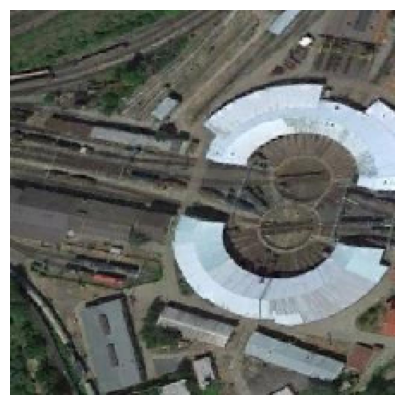

In [66]:
pred_probs = model.predict(images_test)
preds = pred_probs.argmax(axis=-1)

# choose example (railway station)
ix = 0

print(f"Real={labels_test[ix]}; pred={preds[ix]}")
plt.figure(figsize=(5, 5))
plt.imshow(ops.convert_to_numpy(images_test[ix]))
plt.axis("off")
plt.show()